In [1]:
sys.path.insert(1, '../FrenetSerretMeanShape')
from frenet_path import *
from trajectory import *
from model_curvatures import *
from estimation_algo_utils import *
from maths_utils import *
from simu_utils import *
from visu_utils import *
from pre_process_Mocaplab_data import take_numpy_subset, barycenter_from_3ptsHand
import numpy as np
from pickle import *
import dill as pickle
import sys
import os.path
from scipy.interpolate import interp1d
from scipy.misc import derivative

INFO: Using numpy backend


In [10]:
# path = r"/home/pchassat/Documents/frenet-serret-smoothing/data/Repetitions_LSF/SMI2_X0077_1.csv"
path = r"/home/pchassat/Documents/frenet-serret-smoothing/data/LSFtraj/RO1_X0020.Titres2.csv"
# path = r"/home/pchassat/Documents/frenet-serret-smoothing/data/LSFtraj/RO1_X0023.Titres4.csv"
hand_barycentre = barycenter_from_3ptsHand(path, plot=False)
# print(hand_barycentre.colums)
segment = [0, 1000000]
data_traj = take_numpy_subset(hand_barycentre, segment[0], segment[1])
t = np.linspace(0,1,len(data_traj))
print(data_traj.shape)
plot_3D_means([data_traj], [], " ", "")

(1233, 3)


In [11]:
data_traj = data_traj[:int(data_traj.shape[0]/2)]
t = np.linspace(0,1,len(data_traj))

In [12]:
index = hand_barycentre.index
number_of_rows = len(index)
print(number_of_rows)

1233


In [13]:
param_loc_poly_deriv = { "h_min" : 0.01, "h_max" : 0.01, "nb_h" : 20}
param_loc_poly_TNB = {"h" : 50, "p" : 3, "iflag": [1,1], "ibound" : 1}
X_new, X, Q_LP, Q_GS, theta_extrins, successLocPoly = pre_process_data(data_traj, t, 1000, param_loc_poly_deriv, param_loc_poly_TNB, scale_ind={"ind":True,"val":1}, locpolyTNB_local=True)

In [5]:
# Q_GS.grid_eval = np.linspace(0,1,3000)

In [14]:
plot_2D(t, X.S(t))
plot_2D(t, X.Sdot(t))

Sdotdot = derivative(X.Sdot, t, dx=1e-6)
plot_2D(t, Sdotdot)
Sdotdotdot = derivative(X.Sdot, t, dx=1e-6, n=2)
plot_2D(t, Sdotdotdot)

t_new = np.linspace(0,1,3000)
invS = interp1d(X.S(t_new), t_new)

In [35]:
Q_GS = X.TNB_GramSchmidt(invS(np.linspace(0.02,0.98,1000)))

In [40]:
h = 0.001
Q_GS.compute_neighbors(h)
mKappa, mTau, mS, mOmega, gam, ind_conv = compute_raw_curvatures(Q_GS, h, Q_GS, False)
print(len(mS))

977


In [41]:
plot_2D(mS, mKappa)
plot_2D(mS, mTau)

In [21]:
# t_bornes = [0.2,0.85]
print(len(mS))
s_lim = [0.02, 0.97]
ind_bornes = np.intersect1d(np.where(mS>s_lim[0]), np.where(mS<s_lim[1]))
print(len(ind_bornes))

15032
12222


In [22]:
mS_cut = mS[ind_bornes]
mKappa_cut = mKappa[ind_bornes]
mTau_cut = mTau[ind_bornes]
plot_2D(mS_cut, mKappa_cut)
plot_2D(mS_cut, mTau_cut)

In [23]:
lbda1 = 1e-10
lbda2 = 1e-10
curv_smoother = BasisSmoother(domain_range=(s_lim[0],s_lim[1]), nb_basis=1000)
tors_smoother = BasisSmoother(domain_range=(s_lim[0],s_lim[1]), nb_basis=1000)
Model_theta = Model(curv_smoother, tors_smoother)
theta_curv = Model_theta.curv.smoothing(mS_cut, mKappa_cut, mOmega[ind_bornes], lbda1)
theta_torsion = Model_theta.tors.smoothing(mS_cut, mTau_cut, mOmega[ind_bornes], lbda2)

In [24]:
plot_2D(mS_cut, Model_theta.curv.function(mS_cut))
plot_2D(mS_cut, Model_theta.tors.function(mS_cut))
mKappa_cut_bis_bis = Model_theta.curv.function(mS_cut)
mTau_cut_bis_bis = Model_theta.tors.function(mS_cut)

In [25]:
threshold = 1e-1000
abs_Tau = np.abs(mTau_cut_bis)
ind_pos = np.intersect1d(np.where((abs_Tau>threshold)), np.where((mKappa_cut_bis>threshold)))
# ind_pos = np.intersect1d(ind_pos, ind_bornes)
t_new = np.linspace(0,1,3000)
invS = interp1d(X.S(t_new), t_new)
print(mS[0], mS[-1])
mt = invS(mS[ind_bornes])
log_v = np.log(X.Sdot(mt))[ind_pos]
log_tau = np.log(abs_Tau[ind_pos])
log_kappa = np.log(mKappa_cut_bis[ind_pos])

NameError: name 'mTau_cut_bis' is not defined

In [26]:
plot_2D(mt, X.Sdot(mt))
plot_2D(mt, mKappa)
plot_2D(mt, mTau)

NameError: name 'mt' is not defined

In [18]:
plot_2D(mt[ind_pos], log_v)
plot_2D(mt[ind_pos], log_kappa/log_v)
# plot_array_2D(mt[ind_pos], np.array([log_v, 10-1/3*log_kappa-1/6*log_tau]), '')
plot_2D(mt[ind_pos], log_tau)
plot_array_2D(mt[ind_pos], np.array([log_v, 8.-1/6*log_tau-1/3*log_kappa]), '')

# Regression

In [19]:
from sklearn.linear_model import LinearRegression
y = log_v

- ### kappa tau PL

In [20]:
x = np.stack((log_tau, log_kappa),1)
model = LinearRegression()
model.fit(x, y)
r_sq = model.score(x, y)
print('coefficient of determination:', r_sq)
print('intercept:', model.intercept_)
print('slope:', model.coef_)

coefficient of determination: 0.7731364230699225
intercept: 9.551144615219497
slope: [-0.16633909 -0.41110476]


In [21]:
plot_array_2D(mt[ind_pos], np.array([log_v, model.intercept_ + model.coef_[0]*log_tau + model.coef_[1]*log_kappa]), '')

- ### kappa PL

In [22]:
x = log_kappa
x = x.reshape(-1, 1)
model = LinearRegression()
model.fit(x, y)
r_sq = model.score(x, y)
print('coefficient of determination:', r_sq)
print('intercept:', model.intercept_)
print('slope:', model.coef_)

coefficient of determination: 0.6861631500677623
intercept: 8.966584303480387
slope: [-0.44930774]


In [23]:
plot_array_2D(mt[ind_pos], np.array([log_v, model.intercept_ + model.coef_[0]*log_kappa]), '')

- ### c kappa tau PL

In [24]:
x = log_kappa + 1/2*log_tau
x = x.reshape(-1, 1)
model = LinearRegression()
model.fit(x, y)
r_sq = model.score(x, y)
print('coefficient of determination:', r_sq)
print('intercept:', model.intercept_)
print('slope:', model.coef_)

coefficient of determination: 0.7698573726257429
intercept: 9.601292810645031
slope: [-0.39199231]


In [25]:
plot_array_2D(mt[ind_pos], np.array([log_v, model.intercept_ + model.coef_[0]*x[:,0]]), '')

- ### Tot kappa PL

In [47]:
x = 1/2*np.log(abs_Tau[ind_pos]**2+mKappa[ind_pos]**2)
x = x.reshape(-1, 1)
model = LinearRegression()
model.fit(x, y)
r_sq = model.score(x, y)
print('coefficient of determination:', r_sq)
print('intercept:', model.intercept_)
print('slope:', model.coef_)

coefficient of determination: 0.0005040825732305354
intercept: 6.9419731446099435
slope: [-0.02075256]


In [48]:
plot_array_2D(mt[ind_pos], np.array([log_v, model.intercept_ + model.coef_[0]*x[:,0]]), '')

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--/home/pchassat/.local/lib/python3.8/site-packages/pygam/utils.py:78: UserWarning:

Could not import Scikit-Sparse or Suite-Sparse.
This will slow down optimization for models with monotonicity/convexity penalties and many splines.
See installation instructions for installing Scikit-Sparse and Suite-Sparse via Conda.

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
<ipython-input-33-8076d1e19e37>:6: UserWarning:

KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 




LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     19.6024
Link Function:                     IdentityLink Log Likelihood:                         -367374156072.4363
Number of Samples:                          200 AIC:                                     734748312186.0773
                                                AICc:                                    734748312191.0668
                                                GCV:                                                   0.0
                                                Scale:                                                 0.0
                                                Pseudo R-Squared:                                      1.0
Feature Function                  Lam

Text(0, 0.5, 'predicted')

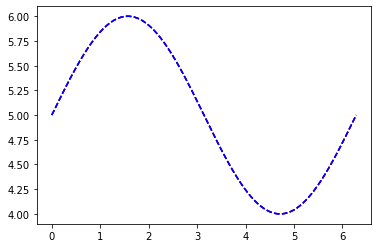

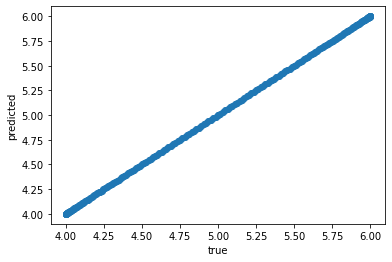

In [33]:
x = np.linspace(0,2*np.pi,200)
x = x[:,np.newaxis]
y = np.sin(x) + 5
gam = LinearGAM(s(0), verbose=True)
gam.gridsearch(x, y)
gam.summary()
# gam.accuracy(x, y)
XX = gam.generate_X_grid(term=0, n=500)

plt.plot(XX, gam.predict(XX), 'r--')
plt.plot(XX, gam.prediction_intervals(XX, width=.95), color='b', ls='--')

# plt.scatter(x, y, facecolor='gray', edgecolors='none')
# plt.title('95% prediction interval')
plt.figure()
plt.scatter(y, gam.predict(x))
plt.xlabel('true')
plt.ylabel('predicted')

4.761904742086332


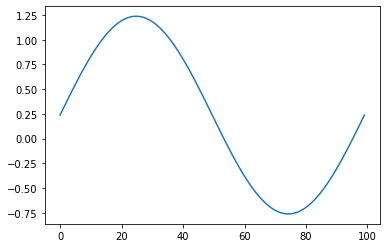

In [38]:
plt.figure()
for i, term in enumerate(gam.terms):
    if term.isintercept:
        continue
    plt.plot(gam.partial_dependence(term=i))
print(gam.coef_[-1])


  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

(12222, 2) (12222,)


/home/pchassat/.local/lib/python3.8/site-packages/pygam/utils.py:78: UserWarning:

Could not import Scikit-Sparse or Suite-Sparse.
This will slow down optimization for models with monotonicity/convexity penalties and many splines.
See installation instructions for installing Scikit-Sparse and Suite-Sparse via Conda.

100% (11 of 11) |########################| Elapsed Time: 0:00:02 Time:  0:00:02
<ipython-input-25-88ad40511d2f>:14: UserWarning:

KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 




LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     29.5225
Link Function:                     IdentityLink Log Likelihood:                                -16117.1777
Number of Samples:                        12222 AIC:                                            32295.4004
                                                AICc:                                           32295.5582
                                                GCV:                                                0.3335
                                                Scale:                                               0.332
                                                Pseudo R-Squared:                                   0.2909
Feature Function                  Lam

Text(0, 0.5, 'predicted')

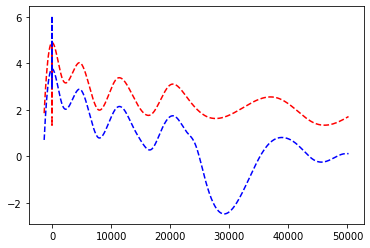

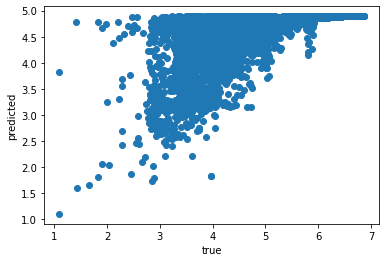

In [25]:
from pygam import LinearGAM, s

mt_cut = invS(mS_cut)
y = np.log(X.Sdot(mt_cut))
# y = X.Sdot(mt_cut)
# x = np.stack((mKappa_cut_bis_bis, mTau_cut_bis_bis), 1)
x = np.stack((mKappa_cut, mTau_cut), 1)
# x = mKappa_cut_bis_bis**2 + mTau_cut_bis_bis**2
# x = x[:,np.newaxis]
print(x.shape, y.shape)
gam = LinearGAM(s(0) + s(1), verbose=True)
# gam = LinearGAM(s(0), verbose=True)
gam.gridsearch(x, y)
gam.summary()
# gam.accuracy(x, y)
XX = gam.generate_X_grid(term=0, n=500)

plt.plot(XX, gam.predict(XX), 'r--')
plt.plot(XX, gam.prediction_intervals(XX, width=.95), color='b', ls='--')

# plt.scatter(x, y, facecolor='gray', edgecolors='none')
# plt.title('95% prediction interval')
plt.figure()
plt.scatter(y, gam.predict(x))
plt.xlabel('true')
plt.ylabel('predicted')

In [42]:
print(gam.coef_[-1])

2.63455503836021


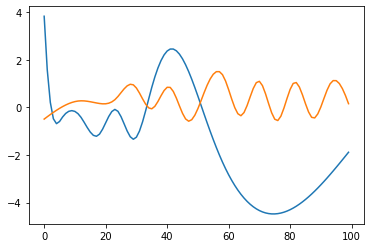

In [43]:
plt.figure()
for i, term in enumerate(gam.terms):
    if term.isintercept:
        continue
    plt.plot(gam.partial_dependence(term=i))

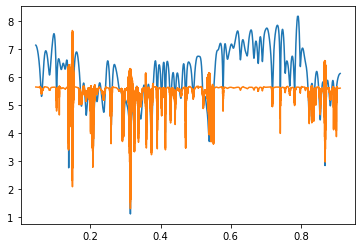

In [44]:
plt.plot(mt_cut, y)
plt.plot(mt_cut, gam.predict(x))

In [35]:
bornes_s = [0.1199, 0.3259, 0.437, 0.662, 0.948]
ind_part = []
for i in range(len(bornes_s)-1):
    ind_part.append(np.intersect1d(np.where(mS_cut>bornes_s[i]), np.where(mS_cut<bornes_s[i+1])))
part = []
for i in range(len(bornes_s)-1):
    part.append({"y" : y[ind_part[i]], "x" : x[ind_part[i],:]})

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
<ipython-input-39-31c77500f2a5>:4: UserWarning:

KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 


  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:  00:00:00

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                       35.55
Link Function:                     IdentityLink Log Likelihood:                                -17612.3605
Number of Samples:                         1597 AIC:                                            35297.8209
                                                AICc:                                           35299.5811
                                                GCV:                                                0.0379
                                                Scale:                                              0.0364
                                                Pseudo R-Squared:                                   0.9155
Feature Function                  Lam

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
<ipython-input-39-31c77500f2a5>:4: UserWarning:

KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 


  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:  00:00:00

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     38.7809
Link Function:                     IdentityLink Log Likelihood:                                -38933.3624
Number of Samples:                         4857 AIC:                                            77946.2866
                                                AICc:                                           77946.9603
                                                GCV:                                                0.0498
                                                Scale:                                              0.0491
                                                Pseudo R-Squared:                                     0.92
Feature Function                  Lam

100% (11 of 11) |########################| Elapsed Time: 0:00:01 Time:  0:00:01
<ipython-input-39-31c77500f2a5>:4: UserWarning:

KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 


  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     38.7099
Link Function:                     IdentityLink Log Likelihood:                                -25006.8699
Number of Samples:                         3248 AIC:                                            50093.1596
                                                AICc:                                           50094.1676
                                                GCV:                                                0.0517
                                                Scale:                                              0.0506
                                                Pseudo R-Squared:                                   0.9284
Feature Function                  Lam

100% (11 of 11) |########################| Elapsed Time: 0:00:01 Time:  0:00:01
<ipython-input-39-31c77500f2a5>:4: UserWarning:

KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 




LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     37.8202
Link Function:                     IdentityLink Log Likelihood:                               -173467.0131
Number of Samples:                         5318 AIC:                                           347011.6666
                                                AICc:                                          347012.2523
                                                GCV:                                                 0.014
                                                Scale:                                              0.0138
                                                Pseudo R-Squared:                                   0.9647
Feature Function                  Lam

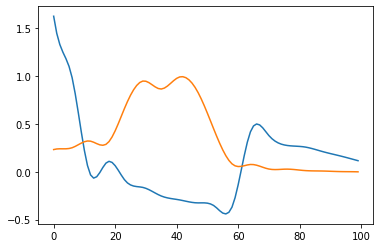

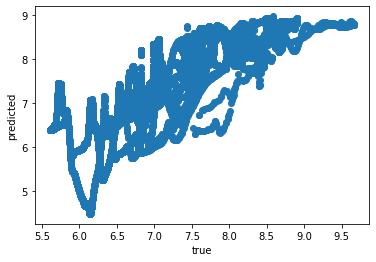

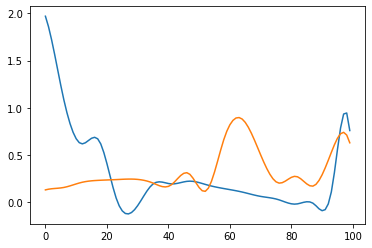

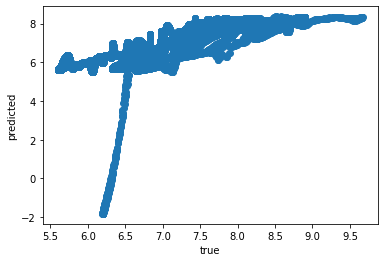

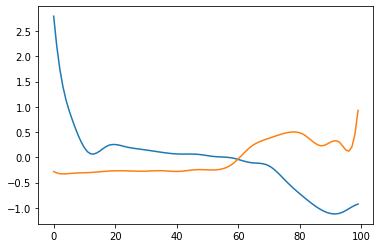

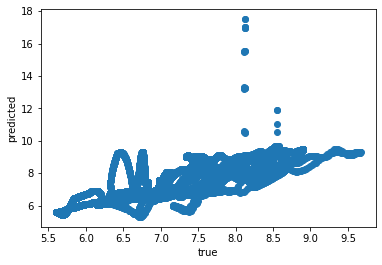

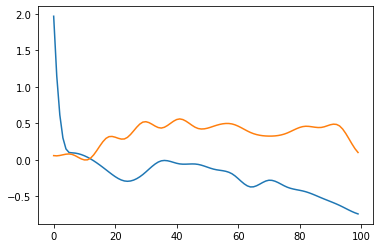

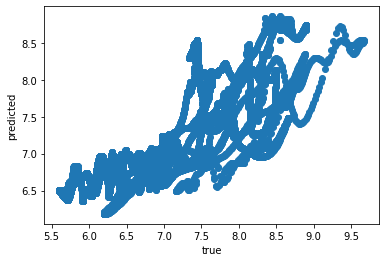

In [39]:
for i in range(len(bornes_s)-1): 
    gam = LinearGAM(s(0) + s(1))
    gam.gridsearch(part[i]["x"], part[i]["y"])
    gam.summary()
    plt.figure()
    for i, term in enumerate(gam.terms):
        if term.isintercept:
            continue
        plt.plot(gam.partial_dependence(term=i))
    plt.figure()
    plt.scatter(y, gam.predict(x))
    plt.xlabel('true')
    plt.ylabel('predicted')

In [2]:
filename = "gam_LSFtraj"
fil = open(filename,"rb")
dic = pickle.load(fil)
fil.close()

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     38.7986
Link Function:                     IdentityLink Log Likelihood:                                -32304.7562
Number of Samples:                        26285 AIC:                                            64689.1095
                                                AICc:                                           64689.2332
                                                GCV:                                                 0.455
                                                Scale:                                              0.4538
                                                Pseudo R-Squared:                                   0.1718
Feature Function                  Lam

<ipython-input-12-fbd171d6e139>:4: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam_array[i].summary())


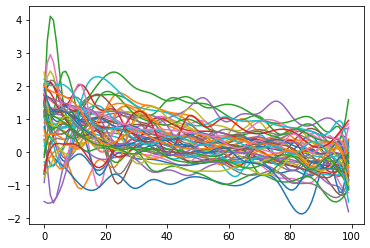

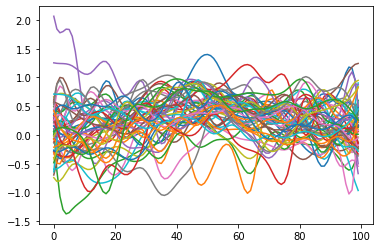

In [12]:
gam_array = dic["gam_array"]
N = len(gam_array)
for i in range(N):
    print(gam_array[i].summary())

plt.figure()
for i in range(N):
    plt.plot(gam_array[i].partial_dependence(term=0))
plt.show()

plt.figure()
for i in range(N):
    plt.plot(gam_array[i].partial_dependence(term=1))
plt.show()

# for i in range(N):
#     print(gam_array[i].coef_[1])